In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pystac_client
import stackstac
import stacmap

from IPython.display import Image
from odc.stac import load
from tqdm import tqdm
from typing import List

import odc.stac

In [2]:
client = pystac_client.Client.open("https://earth-search.aws.element84.com/v1")

In [3]:
collections = list(client.get_collections())
n_collections = len(collections)

In [4]:
print(f"There are {n_collections} collections:\n")
for c in collections:
    print(c.id)

There are 9 collections:

sentinel-2-pre-c1-l2a
cop-dem-glo-30
naip
cop-dem-glo-90
landsat-c2-l2
sentinel-2-l2a
sentinel-2-l1c
sentinel-2-c1-l2a
sentinel-1-grd


In [ ]:
collection = "sentinel-2-l2a"
date="2023-07-01/2023-07-30"

In [5]:
lon, lat = -127.650631, 54.064817
bbox = (lon-0.25, lat-0.25, 
        lon+0.25, lat+0.25) # min lon,lat, max lon, lat

In [13]:
%%time
items_2023 = client.search(collections=[collection], 
                      datetime=date,
                      intersects=dict(type="Point", coordinates=[lon, lat]),
                      query=["s2:nodata_pixel_percentage=0",
                             "s2:degraded_msi_data_percentage=0"])

CPU times: user 553 μs, sys: 1e+03 ns, total: 554 μs
Wall time: 559 μs


In [14]:
items_2023

In [17]:
n_items_23 = len(items_2023.get_all_items())
n_items_23

4

In [18]:
print(f"{items_2023.matched()} items found:\n")
for item in items_2023.items():
    print(item.id,":",
          item.properties['eo:cloud_cover'],
          item.properties['s2:nodata_pixel_percentage'])


4 items found:

S2A_9UWV_20230713_0_L2A : 7.63454 0
S2A_9UWA_20230713_0_L2A : 47.554556 0
S2A_9UWV_20230703_0_L2A : 0.036801 0
S2A_9UWA_20230703_0_L2A : 4.225361 0


In [19]:
min_cloud_23 = min(items_2023.items(),
                   key=lambda item: item.properties["eo:cloud_cover"])
print(min_cloud_23.id, min_cloud_23.properties["eo:cloud_cover"])

S2A_9UWV_20230703_0_L2A 0.036801


In [20]:
Image(url=min_cloud_23.assets["thumbnail"].href, width=800)

In [21]:
assets=min_cloud_23.assets.items()
for key,title in assets:
    print(key,'|',title.title)

aot | Aerosol optical thickness (AOT)
blue | Blue (band 2) - 10m
coastal | Coastal aerosol (band 1) - 60m
granule_metadata | None
green | Green (band 3) - 10m
nir | NIR 1 (band 8) - 10m
nir08 | NIR 2 (band 8A) - 20m
nir09 | NIR 3 (band 9) - 60m
red | Red (band 4) - 10m
rededge1 | Red edge 1 (band 5) - 20m
rededge2 | Red edge 2 (band 6) - 20m
rededge3 | Red edge 3 (band 7) - 20m
scl | Scene classification map (SCL)
swir16 | SWIR 1 (band 11) - 20m
swir22 | SWIR 2 (band 12) - 20m
thumbnail | Thumbnail image
tileinfo_metadata | None
visual | True color image
wvp | Water vapour (WVP)
aot-jp2 | Aerosol optical thickness (AOT)
blue-jp2 | Blue (band 2) - 10m
coastal-jp2 | Coastal aerosol (band 1) - 60m
green-jp2 | Green (band 3) - 10m
nir-jp2 | NIR 1 (band 8) - 10m
nir08-jp2 | NIR 2 (band 8A) - 20m
nir09-jp2 | NIR 3 (band 9) - 60m
red-jp2 | Red (band 4) - 10m
rededge1-jp2 | Red edge 1 (band 5) - 20m
rededge2-jp2 | Red edge 2 (band 6) - 20m
rededge3-jp2 | Red edge 3 (band 7) - 20m
scl-jp2 | Sce

In [22]:
selected_bands = ["nir","red","green","blue"]

In [23]:
data = load([min_cloud_23], 
            bands=selected_bands, 
            bbox=bbox).isel(time=0)

In [51]:
# Code from https://gis.stackexchange.com/questions/480666/how-to-convert-sentinel-2-rgb-bands-to-0-255
def sentinel2_l2a_to_rgb(image):
    min_val = 0.0
    max_val = 0.3
    rgb_image = (image / 10000 - min_val) / (max_val - min_val)
    rgb_image[rgb_image < 0] = 0
    rgb_image[rgb_image > 1] = 1
    return rgb_image


In [53]:
rgb_23 = data[["red", "green", "blue"]].to_array().to_numpy()
min_val = np.nanmin(rgb_23)
max_val = np.nanmax(rgb_23)

# Step 2: Normalize the array to range [0, 1]
normalized_rgb_23 = sentinel2_l2a_to_rgb(rgb_23)#(rgb_23 - min_val) / (max_val - min_val)

normalized_rgb_23 = np.transpose(normalized_rgb_23, (1, 2, 0))

In [54]:
normalized_rgb_23.shape

(5626, 3379, 3)

Text(0.5, 1.0, 'NDVI')

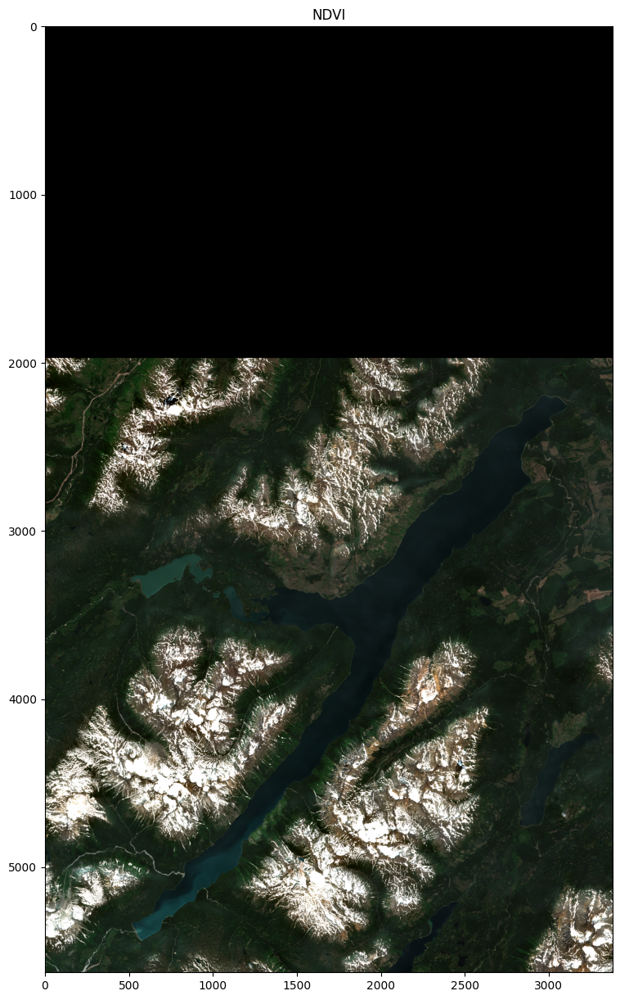

In [55]:
fig, ax = plt.subplots(figsize=(15, 15))

#ax.plot.imshow(robust=True, ax=ax)
cax = ax.imshow(normalized_rgb_23)
ax.set_title("NDVI")

Text(0.5, 1.0, 'NDVI')

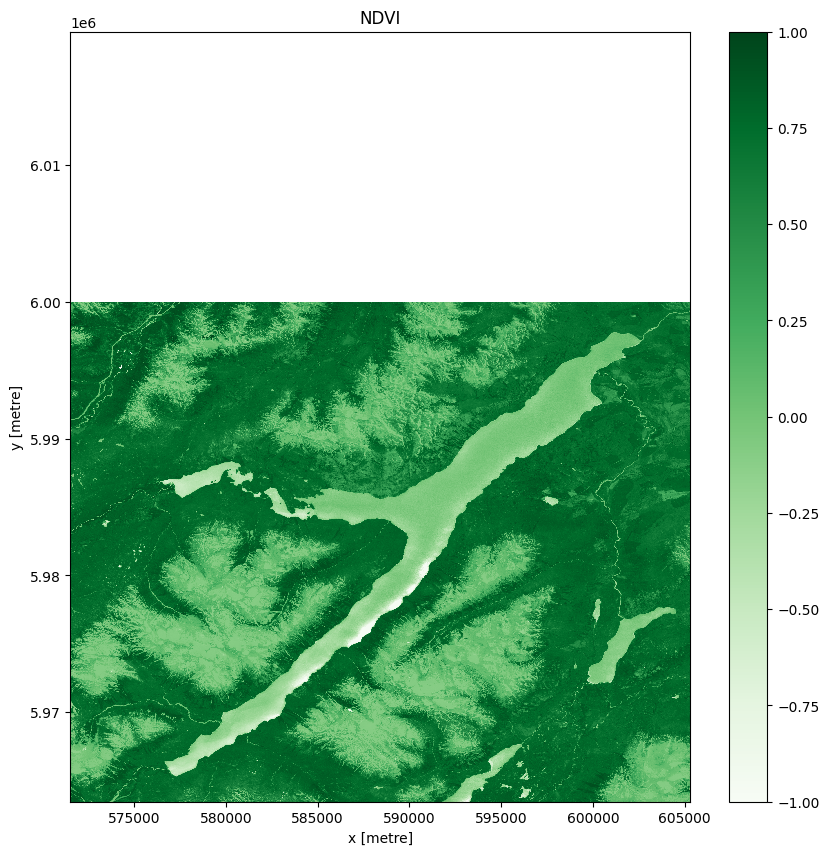

In [56]:
red = data["red"].astype("float")
nir = data["nir"].astype("float")
ndvi = (nir - red) / (nir + red)

fig, ax = plt.subplots(figsize=(10, 10))
ndvi.plot.imshow(ax=ax, cmap="Greens")
ax.set_title("NDVI")

In [60]:
def return_ndvi(data):
    red = data["red"].astype("float")
    nir = data["nir"].astype("float")
    ndvi = (nir - red) / (nir + red)
    return ndvi

def load_data_from_item(item, bands, bbox):
    data = load([item], 
            bands=bands, 
            bbox=bbox).isel(time=0)
    return data

def calculate_median_ndvi(ndvis:list):
    ndvis_array = np.array([n.to_numpy() for n in ndvis])
    median_ndvi = np.nanmedian(ndvis_array, axis=0)
    return median_ndvi

def calculate_mean_ndvi_over_items(items, bands, bbox):
    n_items = len(items.item_collection())
    ndvis = []
    for item in tqdm(items.items(), total=n_items):
        data = load_data_from_item(item, bands, bbox)
        ndvi = return_ndvi(data)
        ndvis.append(ndvi)
    median_ndvi = calculate_median_ndvi(ndvis)
    return median_ndvi

In [61]:
median_ndvi = calculate_mean_ndvi_over_items(items_2023, selected_bands, bbox)

100%|███████████████████████████████████████████████████| 4/4 [02:55<00:00, 43.78s/it]


In [62]:
median_ndvi_23 = median_ndvi

In [63]:
median_ndvi.shape

(5626, 3379)

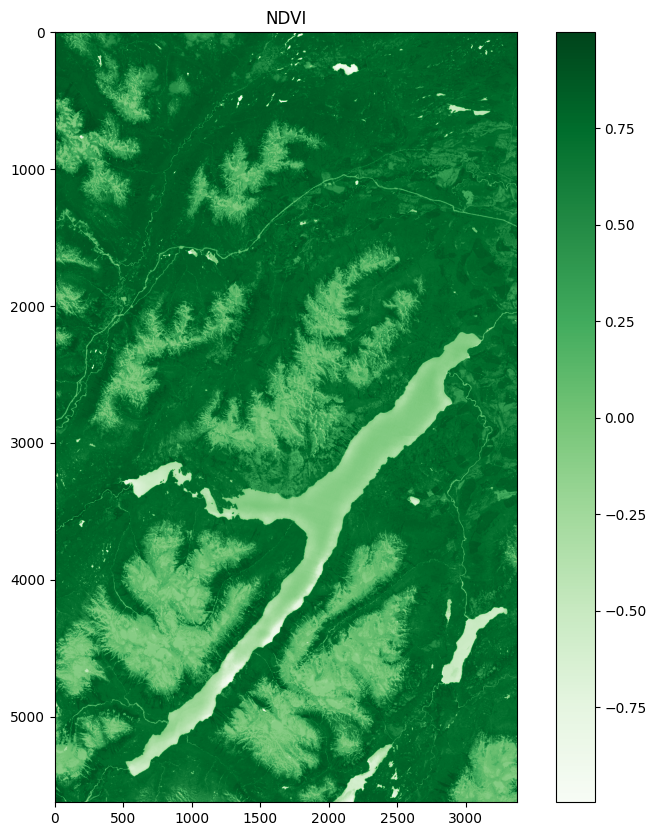

In [64]:
fig, ax = plt.subplots(figsize=(10, 10))
cax = ax.imshow(median_ndvi_23, cmap='Greens')
ax.set_title("NDVI")
fig.colorbar(cax)

In [81]:
dates_2020 = "2018-06-01/2018-08-31"

In [89]:
%%time
items_2020 = client.search(
    collections=[collection], 
    datetime=dates_2020,
    intersects=dict(type="Point", coordinates=[lon, lat]),
    query=["s2:nodata_pixel_percentage<10",
           "s2:degraded_msi_data_percentage<10",
           "eo:cloud_cover<20"])

CPU times: user 2.76 ms, sys: 13.6 ms, total: 16.4 ms
Wall time: 42.5 ms


In [90]:
print(f"{items_2020.matched()} items found:\n")
for item in items_2020.items():
    print(item.id,":",
          item.properties['eo:cloud_cover'],
          item.properties['s2:nodata_pixel_percentage'])

11 items found:

S2A_9UWV_20180818_1_L2A : 2.365881 0
S2A_9UWA_20180818_1_L2A : 10.371104 0
S2A_9UWV_20180818_0_L2A : 2.157774 4.6e-05
S2A_9UWA_20180818_0_L2A : 6.820423 7e-06
S2A_9UWA_20180808_0_L2A : 10.751223 0.002532
S2B_9UWV_20180724_0_L2A : 3.85669 0.000179
S2B_9UWA_20180724_0_L2A : 8.982517 0.000169
S2B_9UWV_20180714_1_L2A : 13.224976 0
S2B_9UWA_20180714_1_L2A : 16.39262 0
S2B_9UWV_20180714_0_L2A : 8.645559 0
S2B_9UWA_20180714_0_L2A : 16.292514 0


In [91]:
median_ndvi_2020 = calculate_mean_ndvi_over_items(items_2020, 
                                                  selected_bands, 
                                                  bbox)

100%|█████████████████████████████████████████████████| 11/11 [07:10<00:00, 39.11s/it]


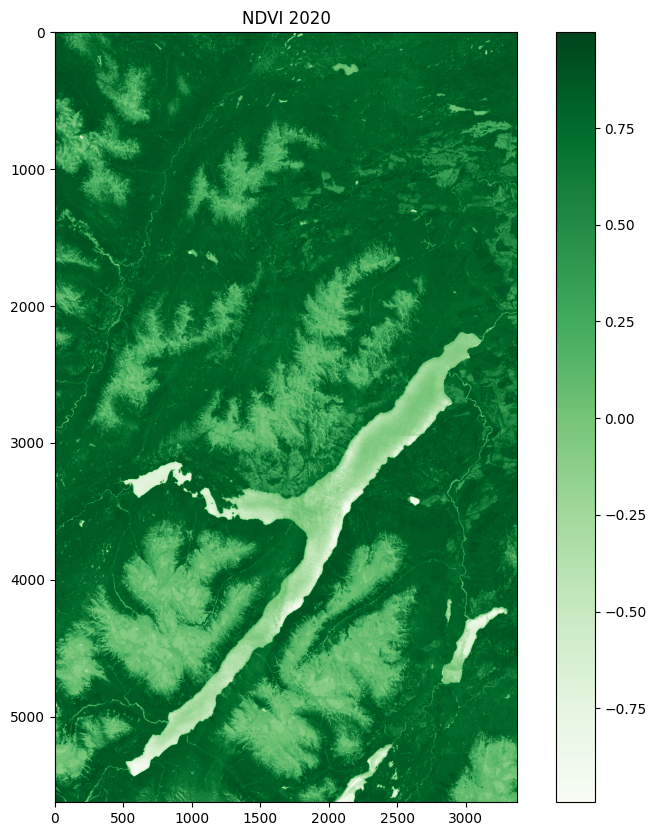

In [92]:
fig, ax = plt.subplots(figsize=(10, 10))
cax = ax.imshow(median_ndvi_2020, cmap='Greens')
ax.set_title("NDVI 2020")
fig.colorbar(cax)

In [94]:
ndvi_difference = median_ndvi_23 - median_ndvi_2020

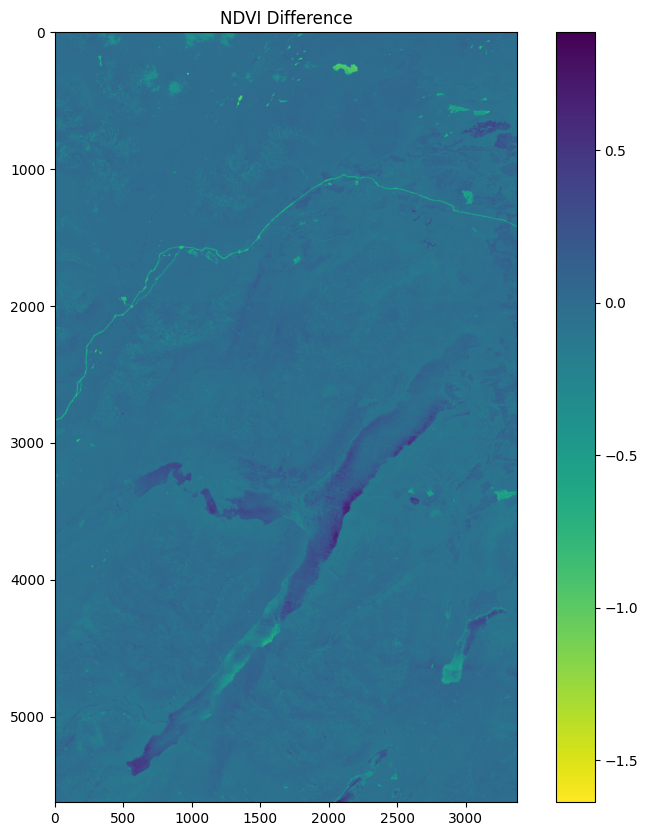

In [99]:
fig, ax = plt.subplots(figsize=(10, 10))
cax = ax.imshow(ndvi_difference, cmap='viridis_r')
ax.set_title("NDVI Difference")
fig.colorbar(cax)

In [ ]:


fig, ax = plt.subplots(figsize=(10, 10))
ndvi.plot.imshow(ax=ax, cmap="Greens")
ax.set_title("NDVI")

In [353]:
import geopandas as gpd

from shapely import geometry, Polygon

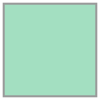

In [363]:
aoi_gdf = gpd.GeoDataFrame({'geometry':[geometry.box(*bbox)]}, crs="EPSG:4326")
aoi_gdf = aoi_gdf.to_crs(32636)

In [364]:
bbox = tuple(map(float, aoi_gdf.bounds.values[0]))

In [371]:
%%time 

stack = stackstac.stack(
    items.item_collection(),
    assets=['nir', 'red'],
    bounds=bbox,
    epsg=32636,
    resolution=30)

CPU times: user 11.2 ms, sys: 2.92 ms, total: 14.1 ms
Wall time: 14.9 ms


In [372]:
stack

<xarray.DataArray 'stackstac-1254423151d55b43d1e0ed63fb33d4f1' (time: 4,
                                                                band: 2,
                                                                y: 2123, x: 1587)> Size: 216MB
dask.array<fetch_raster_window, shape=(4, 2, 2123, 1587), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/53)
  * time                                     (time) datetime64[ns] 32B 2023-0...
    id                                       (time) <U23 368B 'S2A_9UWA_20230...
  * band                                     (band) <U3 24B 'nir' 'red'
  * x                                        (x) float64 13kB -7.824e+05 ... ...
  * y                                        (y) float64 17kB 1.386e+07 ... 1...
    s2:medium_proba_clouds_percentage        (time) float64 32B 2.224 ... 1.026
    ...                                       ...
    title                                    (band) <U20 160B 'NIR 1 (band 8)...
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    common_name                              (band) <U3 24B 'nir' 'red'
    center_wavelength                        (band) float64 16B 0.842 0.665
    full_width_half_max                      (band) float64 16B 0.145 0.038
    epsg                                     int64 8B 32636
Attributes:
    spec:        RasterSpec(epsg=32636, bounds=(-782370, 13798470, -734760, 1...
    crs:         epsg:32636
    transform:   | 30.00, 0.00,-782370.00|\n| 0.00,-30.00, 13862160.00|\n| 0....
    resolution:  30

In [373]:
nir, red = stack.sel(band='nir'), stack.sel(band='red')
ndvi = (nir - red)/((nir + red))
ndvi = ndvi.persist()
ndvi

<xarray.DataArray 'stackstac-1254423151d55b43d1e0ed63fb33d4f1' (time: 4,
                                                                y: 2123, x: 1587)> Size: 108MB
dask.array<truediv, shape=(4, 2123, 1587), dtype=float64, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/48)
  * time                                     (time) datetime64[ns] 32B 2023-0...
    id                                       (time) <U23 368B 'S2A_9UWA_20230...
  * x                                        (x) float64 13kB -7.824e+05 ... ...
  * y                                        (y) float64 17kB 1.386e+07 ... 1...
    s2:medium_proba_clouds_percentage        (time) float64 32B 2.224 ... 1.026
    s2:not_vegetated_percentage              (time) float64 32B 4.389 ... 17.74
    ...                                       ...
    s2:thin_cirrus_percentage                (time) float64 32B 0.004323 ... ...
    s2:dark_features_percentage              (time) float64 32B 2.446 ... 2.72
    gsd                                      int64 8B 10
    proj:shape                               object 8B {10980}
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    epsg                                     int64 8B 32636

In [382]:
ndvi.to_numpy()[0,:,:]

array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [       nan,        nan,        nan, ..., 2.6557377 , 1.50844444,
        1.74506115],
       [       nan,        nan,        nan, ..., 1.30588235, 1.22222222,
        1.1775837 ],
       [       nan,        nan,        nan, ..., 1.23791821, 1.89247311,
        1.33442623]])

In [380]:
stack.attrs

{'spec': RasterSpec(epsg=32636, bounds=(-782370, 13798470, -734760, 13862160), resolutions_xy=(30, 30)),
 'crs': 'epsg:32636',
 'transform': Affine(30.0, 0.0, -782370.0,
        0.0, -30.0, 13862160.0),
 'resolution': 30}

In [326]:
ndvi = ndvi.assign_attrs(stack.attrs)

In [327]:
ndvi_monthly = ndvi.resample(time='ME').median(
    dim='time', keep_attrs=True)
ndvi_monthly

<xarray.DataArray 'stackstac-79756c978c186f4cf8354d32a18a1833' (time: 1,
                                                                y: 2624, x: 1374)> Size: 29MB
dask.array<stack, shape=(1, 2624, 1374), dtype=float64, chunksize=(1, 2624, 1374), chunktype=numpy.ndarray>
Coordinates: (12/18)
  * x                                        (x) float64 11kB 4.999e+05 ... 6...
  * y                                        (y) float64 21kB 6.1e+06 ... 5.8...
    s2:processing_baseline                   <U5 20B '05.09'
    s2:product_type                          <U7 28B 'S2MSI2A'
    platform                                 <U11 44B 'sentinel-2a'
    s2:degraded_msi_data_percentage          int64 8B 0
    ...                                       ...
    s2:saturated_defective_pixel_percentage  int64 8B 0
    s2:datatake_type                         <U8 32B 'INS-NOBS'
    s2:nodata_pixel_percentage               int64 8B 0
    s2:sequence                              <U1 4B '0'
    epsg                                     int64 8B 32609
  * time                                     (time) datetime64[ns] 8B 2023-07-31
Attributes:
    spec:        RasterSpec(epsg=32609, bounds=(499920, 5890160, 609840, 6100...
    crs:         epsg:32609
    transform:   | 80.00, 0.00, 499920.00|\n| 0.00,-80.00, 6100080.00|\n| 0.0...
    resolution:  80

In [314]:
import pyproj
x_utm, y_utm = pyproj.Proj(ndvi_monthly.crs)(lon, lat)
buffer = 20000  # meters

In [315]:
x_utm

588310.5274326967

In [316]:
aoi = ndvi_monthly.loc[..., y_utm+buffer:y_utm-buffer, x_utm-buffer:x_utm+buffer]
aoi

<xarray.DataArray 'stackstac-79756c978c186f4cf8354d32a18a1833' (time: 1,
                                                                y: 500, x: 500)> Size: 2MB
dask.array<getitem, shape=(1, 500, 500), dtype=float64, chunksize=(1, 500, 500), chunktype=numpy.ndarray>
Coordinates: (12/18)
  * x                                        (x) float64 4kB 5.683e+05 ... 6....
  * y                                        (y) float64 4kB 6.012e+06 ... 5....
    s2:processing_baseline                   <U5 20B '05.09'
    s2:product_type                          <U7 28B 'S2MSI2A'
    platform                                 <U11 44B 'sentinel-2a'
    s2:degraded_msi_data_percentage          int64 8B 0
    ...                                       ...
    s2:saturated_defective_pixel_percentage  int64 8B 0
    s2:datatake_type                         <U8 32B 'INS-NOBS'
    s2:nodata_pixel_percentage               int64 8B 0
    s2:sequence                              <U1 4B '0'
    epsg                                     int64 8B 32609
  * time                                     (time) datetime64[ns] 8B 2023-07-31
Attributes:
    spec:        RasterSpec(epsg=32609, bounds=(499920, 5890160, 609840, 6100...
    crs:         epsg:32609
    transform:   | 80.00, 0.00, 499920.00|\n| 0.00,-80.00, 6100080.00|\n| 0.0...
    resolution:  80

In [317]:
import dask.diagnostics
with dask.diagnostics.ProgressBar():
    data = aoi.compute()

[########                                ] | 21% Completed | 11.88 ss

/usr/local/Caskroom/miniconda/base/envs/rs/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


[####################################### ] | 98% Completed | 92.17 s

/usr/local/Caskroom/miniconda/base/envs/rs/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)


[########################################] | 100% Completed | 92.34 s


In [319]:
stackstac.show(data, range=(0, 0.6), cmap="YlGn")

ValueError: No global client found and no address provided

In [318]:
data

<xarray.DataArray 'stackstac-79756c978c186f4cf8354d32a18a1833' (time: 1,
                                                                y: 500, x: 500)> Size: 2MB
array([[[-2.05572172,  2.36286594,  3.69716533, ...,  1.36971624,
          1.44665011,  1.68914889],
        [ 2.02917291,  2.38370004,  2.39982862, ...,  1.69481903,
          1.28031136,  1.49680444],
        [ 2.25647388,  2.06980762,  3.83034985, ...,  1.23406471,
          1.47138488,  1.62706358],
        ...,
        [ 0.54403662,  1.30174852,  1.02445865, ..., -1.73882335,
         -2.53440014,  4.54838253],
        [ 0.35506486,  0.31618423,  1.65437243, ..., -1.66747307,
          1.72658177,  2.13092463],
        [ 0.34814365,  1.21823855,  1.64360845, ..., -0.1350898 ,
          0.00917749,  1.65844272]]])
Coordinates: (12/18)
  * x                                        (x) float64 4kB 5.683e+05 ... 6....
  * y                                        (y) float64 4kB 6.012e+06 ... 5....
    s2:processing_baseline                   <U5 20B '05.09'
    s2:product_type                          <U7 28B 'S2MSI2A'
    platform                                 <U11 44B 'sentinel-2a'
    s2:degraded_msi_data_percentage          int64 8B 0
    ...                                       ...
    s2:saturated_defective_pixel_percentage  int64 8B 0
    s2:datatake_type                         <U8 32B 'INS-NOBS'
    s2:nodata_pixel_percentage               int64 8B 0
    s2:sequence                              <U1 4B '0'
    epsg                                     int64 8B 32609
  * time                                     (time) datetime64[ns] 8B 2023-07-31
Attributes:
    spec:        RasterSpec(epsg=32609, bounds=(499920, 5890160, 609840, 6100...
    crs:         epsg:32609
    transform:   | 80.00, 0.00, 499920.00|\n| 0.00,-80.00, 6100080.00|\n| 0.0...
    resolution:  80

In [279]:
import numpy as np

In [288]:
with dask.diagnostics.ProgressBar():
    ndvi_test = ndvi_monthly.compute()

[                                        ] | 0% Completed | 5.14 s ms

/usr/local/Caskroom/miniconda/base/envs/rs/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


[########                                ] | 20% Completed | 46.26 s

/usr/local/Caskroom/miniconda/base/envs/rs/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


[########################################] | 100% Completed | 338.16 s


In [287]:
data.to_numpy().plot.imshow(robust=True, ax=ax)

AttributeError: 'numpy.ndarray' object has no attribute 'plot'

In [261]:
#fig, ax = plt.subplots(figsize=(10, 10))
#data.plot.imshow(ax=ax, cmap="Greens")
#ax.set_title("NDVI")

In [157]:
sentinel_stack = stackstac.stack(search, assets=["red", "nir", "scl"],
                          bounds=bbox,gdal_env=stackstac.DEFAULT_GDAL_ENV.updated(
                               {'GDAL_HTTP_MAX_RETRY': 3,
                                'GDAL_HTTP_RETRY_DELAY': 5,
                               }),
                          epsg=4326, chunksize=(1, 1, 50, 50)).rename(
       {'x': 'lon', 'y': 'lat'}).to_dataset(dim='band')

TypeError: Unrecognized STAC collection type <class 'pystac_client.item_search.ItemSearch'>: <pystac_client.item_search.ItemSearch object at 0x13992f2c0>

In [12]:
bbox = (point_lon-0.0005, point_lat-0.0005, 
        point_lon+0.0005, point_lat+0.0005)

In [ ]:
stacmap.explore(
    items, 
    prop="eo:cloud_cover", 
    bbox=bbox
)

In [3]:
sentinel_stack = stackstac.stack(items, assets=["red", "nir", "scl"],
                          bounds=[point_lon-0.0005, point_lat-0.0005, point_lon+0.0005, point_lat+0.0005],
                          gdal_env=stackstac.DEFAULT_GDAL_ENV.updated(
                               {'GDAL_HTTP_MAX_RETRY': 3,
                                'GDAL_HTTP_RETRY_DELAY': 5,
                               }),
                          epsg=4326, chunksize=(1, 1, 50, 50)).rename(
       {'x': 'lon', 'y': 'lat'}).to_dataset(dim='band')

In [4]:
sentinel_stack

<xarray.Dataset> Size: 12MB
Dimensions:                                  (time: 2639, lat: 12, lon: 8,
                                              band: 3)
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 21kB 2017-...
    id                                       (time) <U24 253kB 'S2A_15TUL_201...
  * lon                                      (lon) float64 64B -95.5 ... -95.5
  * lat                                      (lat) float64 96B 45.5 ... 45.5
    eo:cloud_cover                           (time) object 21kB 9.642794 ... ...
    s2:product_uri                           (time) <U65 686kB 'S2A_MSIL2A_20...
    ...                                       ...
    title                                    (band) <U30 360B 'Red (band 4) -...
    raster:bands                             (band) object 24B None ... [{'no...
    common_name                              (band) object 24B 'red' 'nir' None
    center_wavelength                        (band) object 24B 0.665 0.842 None
    full_width_half_max                      (band) object 24B 0.038 0.145 None
    epsg                                     int64 8B 4326
Dimensions without coordinates: band
Data variables:
    red                                      (time, lat, lon) float64 2MB dask.array<chunksize=(1, 12, 8), meta=np.ndarray>
    nir                                      (time, lat, lon) float64 2MB dask.array<chunksize=(1, 12, 8), meta=np.ndarray>
    scl                                      (time, lat, lon) float64 2MB dask.array<chunksize=(1, 12, 8), meta=np.ndarray>
Attributes:
    spec:           RasterSpec(epsg=4326, bounds=(-95.50052812266786, 45.4994...
    crs:            epsg:4326
    transform:      | 0.00, 0.00,-95.50|\n| 0.00,-0.00, 45.50|\n| 0.00, 0.00,...
    resolution_xy:  (0.00013326132348367992, 9.283105634949607e-05)

In [5]:
sentinel_stack['ndvi'] = (sentinel_stack['nir'] - sentinel_stack['red'])/\
                        (sentinel_stack['nir'] + sentinel_stack['red'])
sentinel_stack = sentinel_stack[['ndvi', 'scl']]
sentinel_stack = sentinel_stack.drop([c for c in sentinel_stack.coords if not (c in ['time', 'lat', 'lon'])])
sentinel_stack

/var/folders/zz/3lhn60g1163cfzw5vrc_yrp00000gn/T/ipykernel_19105/1659960584.py:4: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  sentinel_stack = sentinel_stack.drop([c for c in sentinel_stack.coords if not (c in ['time', 'lat', 'lon'])])


<xarray.Dataset> Size: 4MB
Dimensions:  (time: 2639, lat: 12, lon: 8)
Coordinates:
  * time     (time) datetime64[ns] 21kB 2017-01-03T17:30:23.064000 ... 2024-0...
  * lon      (lon) float64 64B -95.5 -95.5 -95.5 -95.5 -95.5 -95.5 -95.5 -95.5
  * lat      (lat) float64 96B 45.5 45.5 45.5 45.5 45.5 ... 45.5 45.5 45.5 45.5
Data variables:
    ndvi     (time, lat, lon) float64 2MB dask.array<chunksize=(1, 12, 8), meta=np.ndarray>
    scl      (time, lat, lon) float64 2MB dask.array<chunksize=(1, 12, 8), meta=np.ndarray>
Attributes:
    spec:           RasterSpec(epsg=4326, bounds=(-95.50052812266786, 45.4994...
    crs:            epsg:4326
    transform:      | 0.00, 0.00,-95.50|\n| 0.00,-0.00, 45.50|\n| 0.00, 0.00,...
    resolution_xy:  (0.00013326132348367992, 9.283105634949607e-05)

In [6]:
from pystac_client import Client

catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

bbox = (-67.008753, -9.96445, -65.615556, -8.57408)

items = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox,
    datetime="2019-06-01/2019-06-10"
).item_collection()

/usr/local/Caskroom/miniconda/base/envs/rs/lib/python3.12/site-packages/pystac_client/item_search.py:851: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


In [9]:
items

In [7]:
import geopandas as gpd
import shapely
import folium

gdf = gpd.GeoDataFrame.from_features(
    items.to_dict(), 
    crs="EPSG:4326"
)
bbox_geom = shapely.geometry.mapping(shapely.geometry.box(*bbox))
bbox_layer = folium.GeoJson(bbox_geom)

m = gdf.explore(column="eo:cloud_cover")
bbox_layer.add_to(m)
m

In [8]:
import stacmap

stacmap.explore(
    items, 
    prop="eo:cloud_cover", 
    bbox=bbox
)